In [1]:
!pip install -q ultralytics albumentations grad-cam
import ultralytics
ultralytics.checks()

Ultralytics 8.4.37 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6841.9/8062.4 GB disk)


In [3]:
import os, json, shutil, random, copy, warnings
from pathlib import Path
from collections import defaultdict

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from tqdm.notebook import tqdm
import albumentations as A

import torch
import torch.nn as nn
from torchvision import models, transforms
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

from ultralytics import YOLO

warnings.filterwarnings('ignore')
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
random.seed(42); np.random.seed(42)
print(f'Device: {DEVICE}')

Device: cuda


In [ ]:

IMAGES_DIR   = '/kaggle/input/datasets/vidishagar/cvat-defect/CVAT Defective Photos'        # folder with all 105 images
ANNO_FILE_1  = '/kaggle/input/datasets/vidishagar/annotations-defect/job_3719466_annotations_2026_03_11_07_58_56_coco 1.0/annotations/instances_default.json'
ANNO_FILE_2  = '/kaggle/input/datasets/vidishagar/annotations-defect/job_3723280_annotations_2026_04_07_10_33_16_coco 1.0/annotations/instances_default.json'
# ═══════════════════════════════════════════════

WORK_DIR     = '/kaggle/working'
MERGED_JSON  = f'{WORK_DIR}/merged_coco.json'
YOLO_DIR     = f'{WORK_DIR}/yolo_dataset'
AUG_DIR      = f'{WORK_DIR}/augmented_dataset'
FINAL_DIR    = f'{WORK_DIR}/final_dataset'

VAL_SPLIT    = 0.15   # 15% validation
TEST_SPLIT   = 0.10   # 10% test
AUG_FACTOR   = 5      # generate N augmented versions per original image

print('Config loaded.')

Config loaded.


In [ ]:
def merge_coco(file1, file2, images_dir, output_path):
    with open(file1) as f: coco1 = json.load(f)
    with open(file2) as f: coco2 = json.load(f)

    #  Merge categories, resolving name conflicts ──
    cat_name_to_id = {}   # final name → new ID
    cat_id_map1    = {}   # old ID in file1 → new ID
    cat_id_map2    = {}   # old ID in file2 → new ID
    merged_cats    = []
    new_cat_id     = 1

    for cat in coco1.get('categories', []):
        name = cat['name'].strip().lower()
        if name not in cat_name_to_id:
            cat_name_to_id[name] = new_cat_id
            merged_cats.append({'id': new_cat_id, 'name': name, 'supercategory': cat.get('supercategory', 'defect')})
            new_cat_id += 1
        cat_id_map1[cat['id']] = cat_name_to_id[name]

    for cat in coco2.get('categories', []):
        name = cat['name'].strip().lower()
        if name not in cat_name_to_id:
            cat_name_to_id[name] = new_cat_id
            merged_cats.append({'id': new_cat_id, 'name': name, 'supercategory': cat.get('supercategory', 'defect')})
            new_cat_id += 1
        cat_id_map2[cat['id']] = cat_name_to_id[name]

    # Merge images, re-assign IDs to avoid conflicts ──
    merged_images  = []
    img_fname_to_id = {}   # filename → new image ID
    img_id_map1    = {}
    img_id_map2    = {}
    new_img_id     = 1

    def add_images(coco, id_map, images_dir):
        nonlocal new_img_id
        for img in coco.get('images', []):
            fname = Path(img['file_name']).name   # strip any directory prefix
            full_path = Path(images_dir) / fname
            if not full_path.exists():
                print(f'  WARNING: image not found, skipping: {fname}')
                continue
            if fname not in img_fname_to_id:
                img_fname_to_id[fname] = new_img_id
                merged_images.append({
                    'id':        new_img_id,
                    'file_name': fname,
                    'width':     img['width'],
                    'height':    img['height'],
                })
                new_img_id += 1
            id_map[img['id']] = img_fname_to_id[fname]

    add_images(coco1, img_id_map1, images_dir)
    add_images(coco2, img_id_map2, images_dir)

    # Merge annotations ──
    merged_annos = []
    new_anno_id  = 1

    def add_annotations(coco, img_id_map, cat_id_map):
        nonlocal new_anno_id
        for anno in coco.get('annotations', []):
            old_img_id = anno['image_id']
            old_cat_id = anno['category_id']
            if old_img_id not in img_id_map:
                continue   # image was skipped (not found)
            merged_annos.append({
                'id':           new_anno_id,
                'image_id':     img_id_map[old_img_id],
                'category_id':  cat_id_map[old_cat_id],
                'bbox':         anno['bbox'],   # [x, y, w, h] COCO format
                'area':         anno.get('area', anno['bbox'][2] * anno['bbox'][3]),
                'iscrowd':      anno.get('iscrowd', 0),
            })
            new_anno_id += 1

    add_annotations(coco1, img_id_map1, cat_id_map1)
    add_annotations(coco2, img_id_map2, cat_id_map2)

    merged = {
        'info':        {'description': 'Merged PCB defect dataset'},
        'categories':  merged_cats,
        'images':      merged_images,
        'annotations': merged_annos,
    }

    with open(output_path, 'w') as f:
        json.dump(merged, f, indent=2)

    return merged

merged = merge_coco(ANNO_FILE_1, ANNO_FILE_2, IMAGES_DIR, MERGED_JSON)

print(f'\n── Merged COCO Dataset ──')
print(f'Images      : {len(merged["images"])}')
print(f'Annotations : {len(merged["annotations"])}')
print(f'Categories  : {len(merged["categories"])}')
print(f'\nDefect types found:')
for cat in merged['categories']:
    count = sum(1 for a in merged['annotations'] if a['category_id'] == cat['id'])
    print(f'  [{cat["id"]}] {cat["name"]:30s} → {count} annotations')


── Merged COCO Dataset ──
Images      : 92
Annotations : 99
Categories  : 16

Defect types found:
  [1] component_damage               → 8 annotations
  [2] solder_ short                  → 3 annotations
  [3] component_crack                → 7 annotations
  [4] solder_ball                    → 0 annotations
  [5] dry_ solder                    → 2 annotations
  [6] component_liftup               → 11 annotations
  [7] component_shift                → 2 annotations
  [8] component_no solder            → 3 annotations
  [9] wrong_polarity                 → 3 annotations
  [10] pad_damage                     → 3 annotations
  [11] component_tombstone            → 5 annotations
  [12] component_missing              → 9 annotations
  [13] component_solder short         → 24 annotations
  [14] dry_solder                     → 12 annotations
  [15] led_damage                     → 4 annotations
  [16] solder_boll                    → 3 annotations


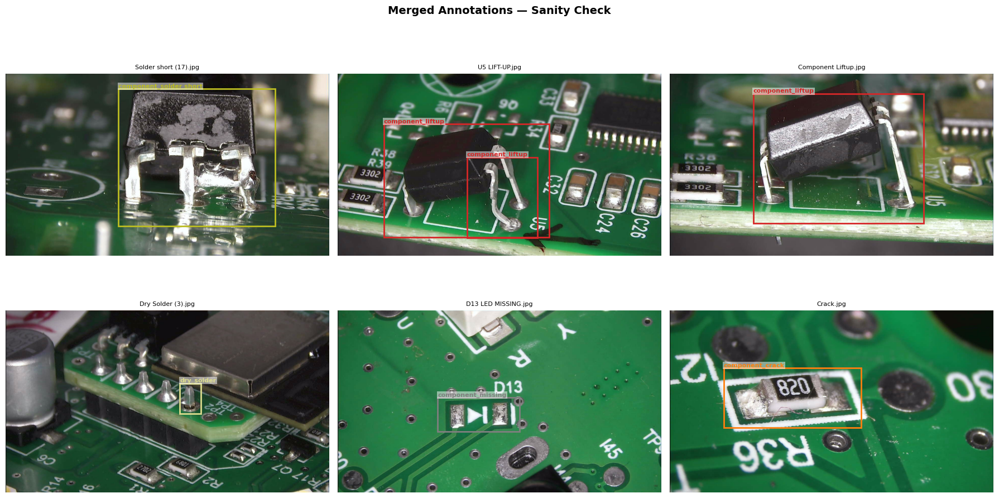

In [6]:
# Build lookup structures
id_to_cat   = {c['id']: c['name'] for c in merged['categories']}
img_id_to_info = {img['id']: img for img in merged['images']}
img_id_to_annos = defaultdict(list)
for anno in merged['annotations']:
    img_id_to_annos[anno['image_id']].append(anno)

COLORS = plt.cm.get_cmap('tab20', len(merged['categories']))

def draw_coco_boxes(img_id, ax):
    info  = img_id_to_info[img_id]
    img   = cv2.cvtColor(cv2.imread(str(Path(IMAGES_DIR)/info['file_name'])), cv2.COLOR_BGR2RGB)
    ax.imshow(img)
    for anno in img_id_to_annos[img_id]:
        x, y, w, h = anno['bbox']
        cat_id     = anno['category_id']
        color      = COLORS(cat_id - 1)
        rect       = patches.Rectangle((x,y), w, h, linewidth=2,
                                        edgecolor=color, facecolor='none')
        ax.add_patch(rect)
        ax.text(x, y-4, id_to_cat[cat_id], color=color,
                fontsize=8, fontweight='bold',
                bbox=dict(facecolor='white', alpha=0.5, pad=1, edgecolor='none'))
    ax.set_title(info['file_name'][:25], fontsize=8)
    ax.axis('off')

sample_ids = random.sample(list(img_id_to_info.keys()), min(6, len(img_id_to_info)))
fig, axes  = plt.subplots(2, 3, figsize=(18, 10))
for ax, img_id in zip(axes.flatten(), sample_ids):
    draw_coco_boxes(img_id, ax)
plt.suptitle('Merged Annotations — Sanity Check', fontsize=14, fontweight='bold')
plt.tight_layout(); plt.show()

In [7]:
def coco_to_yolo(merged_coco, images_dir, output_dir):
    out_imgs   = Path(output_dir) / 'images'
    out_labels = Path(output_dir) / 'labels'
    out_imgs.mkdir(parents=True, exist_ok=True)
    out_labels.mkdir(parents=True, exist_ok=True)

    # YOLO class IDs are 0-indexed
    cat_id_to_yolo = {cat['id']: idx for idx, cat in enumerate(merged_coco['categories'])}
    class_names    = [cat['name'] for cat in merged_coco['categories']]

    skipped = 0
    for img_info in tqdm(merged_coco['images'], desc='Converting to YOLO'):
        fname    = img_info['file_name']
        src_path = Path(images_dir) / fname
        if not src_path.exists():
            skipped += 1
            continue

        iw, ih = img_info['width'], img_info['height']
        # If width/height are 0 in annotations, read from actual image
        if iw == 0 or ih == 0:
            img = cv2.imread(str(src_path))
            ih, iw = img.shape[:2]

        annos = img_id_to_annos[img_info['id']]
        lines = []
        for anno in annos:
            x, y, w, h = anno['bbox']   # COCO: top-left x,y + width,height
            # Convert to YOLO: center x,y + width,height, all normalized
            cx = (x + w / 2) / iw
            cy = (y + h / 2) / ih
            nw = w / iw
            nh = h / ih
            # Clamp to [0,1] in case of annotation errors
            cx, cy, nw, nh = [max(0.0, min(1.0, v)) for v in [cx, cy, nw, nh]]
            if nw < 0.001 or nh < 0.001:
                continue   # skip degenerate boxes
            yolo_cls = cat_id_to_yolo[anno['category_id']]
            lines.append(f'{yolo_cls} {cx:.6f} {cy:.6f} {nw:.6f} {nh:.6f}')

        if not lines:
            continue   # skip images with no valid annotations

        stem = Path(fname).stem
        shutil.copy(src_path, out_imgs / fname)
        (out_labels / f'{stem}.txt').write_text('\n'.join(lines))

    if skipped:
        print(f'Skipped {skipped} images (not found in images dir)')
    print(f'Converted {len(list(out_imgs.iterdir()))} images')
    return class_names

Path(YOLO_DIR).mkdir(parents=True, exist_ok=True)
CLASS_NAMES = coco_to_yolo(merged, IMAGES_DIR, YOLO_DIR)
NUM_CLASSES = len(CLASS_NAMES)

print(f'\nYOLO class mapping:')
for i, name in enumerate(CLASS_NAMES):
    print(f'  {i}: {name}')

Converting to YOLO:   0%|          | 0/92 [00:00<?, ?it/s]

Converted 92 images

YOLO class mapping:
  0: component_damage
  1: solder_ short
  2: component_crack
  3: solder_ball
  4: dry_ solder
  5: component_liftup
  6: component_shift
  7: component_no solder
  8: wrong_polarity
  9: pad_damage
  10: component_tombstone
  11: component_missing
  12: component_solder short
  13: dry_solder
  14: led_damage
  15: solder_boll


Total images : 92
Train        : 70
Val          : 13
Test         : 9


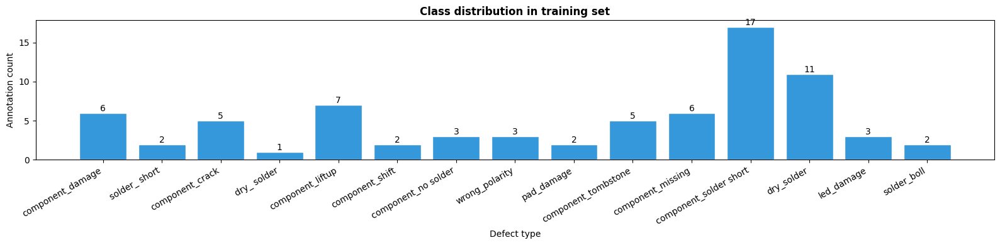

In [8]:
all_images = sorted((Path(YOLO_DIR) / 'images').glob('*'))
random.shuffle(all_images)

n       = len(all_images)
n_test  = max(1, int(n * TEST_SPLIT))
n_val   = max(1, int(n * VAL_SPLIT))
n_train = n - n_val - n_test

splits = {
    'train': all_images[:n_train],
    'val':   all_images[n_train:n_train+n_val],
    'test':  all_images[n_train+n_val:],
}

for split, imgs in splits.items():
    (Path(FINAL_DIR) / split / 'images').mkdir(parents=True, exist_ok=True)
    (Path(FINAL_DIR) / split / 'labels').mkdir(parents=True, exist_ok=True)
    for img_path in imgs:
        shutil.copy(img_path, Path(FINAL_DIR) / split / 'images' / img_path.name)
        label_path = Path(YOLO_DIR) / 'labels' / f'{img_path.stem}.txt'
        if label_path.exists():
            shutil.copy(label_path, Path(FINAL_DIR) / split / 'labels' / label_path.name)

print(f'Total images : {n}')
print(f'Train        : {n_train}')
print(f'Val          : {n_val}')
print(f'Test         : {n_test}')

# Class distribution in train set
class_counts = defaultdict(int)
for lbl in (Path(FINAL_DIR)/'train'/'labels').glob('*.txt'):
    for line in lbl.read_text().strip().split('\n'):
        if line: class_counts[int(line.split()[0])] += 1

fig, ax = plt.subplots(figsize=(max(6, NUM_CLASSES), 4))
bars = ax.bar([CLASS_NAMES[i] for i in sorted(class_counts)],
              [class_counts[i] for i in sorted(class_counts)],
              color='#3498db', edgecolor='white')
ax.bar_label(bars)
ax.set_xlabel('Defect type'); ax.set_ylabel('Annotation count')
ax.set_title('Class distribution in training set', fontweight='bold')
plt.xticks(rotation=30, ha='right'); plt.tight_layout(); plt.show()

In [9]:
aug_pipeline = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.15,
                       rotate_limit=15, p=0.6,
                       border_mode=cv2.BORDER_REFLECT),
    A.RandomBrightnessContrast(brightness_limit=0.3,
                                contrast_limit=0.3, p=0.7),
    A.HueSaturationValue(hue_shift_limit=10,
                          sat_shift_limit=20,
                          val_shift_limit=20, p=0.5),
    A.GaussNoise(var_limit=(5, 25), p=0.4),
    A.GaussianBlur(blur_limit=(3, 5), p=0.3),
    A.CLAHE(p=0.3),   # improves contrast for metallic surfaces
], bbox_params=A.BboxParams(
    format='yolo',
    label_fields=['class_labels'],
    min_visibility=0.3   # drop boxes if <30% visible after crop
))

aug_img_dir = Path(FINAL_DIR) / 'train' / 'images'
aug_lbl_dir = Path(FINAL_DIR) / 'train' / 'labels'

train_images = sorted(aug_img_dir.glob('*'))
aug_count    = 0

for img_path in tqdm(train_images, desc='Augmenting training images'):
    lbl_path = aug_lbl_dir / f'{img_path.stem}.txt'
    if not lbl_path.exists(): continue

    img_bgr  = cv2.imread(str(img_path))
    img_rgb  = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

    lines    = [l for l in lbl_path.read_text().strip().split('\n') if l]
    bboxes   = [list(map(float, l.split()[1:])) for l in lines]
    labels   = [int(l.split()[0]) for l in lines]

    for aug_idx in range(AUG_FACTOR):
        try:
            result = aug_pipeline(image=img_rgb, bboxes=bboxes, class_labels=labels)
        except Exception:
            continue
        if not result['bboxes']: continue

        aug_img  = cv2.cvtColor(result['image'], cv2.COLOR_RGB2BGR)
        out_stem = f'{img_path.stem}_aug{aug_idx:02d}'
        cv2.imwrite(str(aug_img_dir / f'{out_stem}.jpg'), aug_img,
                    [cv2.IMWRITE_JPEG_QUALITY, 95])

        aug_lines = [f'{cls} {" ".join(f"{v:.6f}" for v in box)}'
                     for cls, box in zip(result['class_labels'], result['bboxes'])]
        (aug_lbl_dir / f'{out_stem}.txt').write_text('\n'.join(aug_lines))
        aug_count += 1

final_train_count = len(list(aug_img_dir.glob('*')))
print(f'Original train images : {len(train_images)}')
print(f'Augmented versions    : {aug_count}')
print(f'Total train images    : {final_train_count}')

Augmenting training images:   0%|          | 0/70 [00:00<?, ?it/s]

Original train images : 70
Augmented versions    : 350
Total train images    : 420


In [10]:
yaml_content = f"""# PCB Defect Detection Dataset
path: {FINAL_DIR}
train: train/images
val:   val/images
test:  test/images

nc: {NUM_CLASSES}
names: {CLASS_NAMES}
"""

yaml_path = f'{WORK_DIR}/pcb_defects.yaml'
with open(yaml_path, 'w') as f:
    f.write(yaml_content)

print('Dataset YAML:')
print(yaml_content)

Dataset YAML:
# PCB Defect Detection Dataset
path: /kaggle/working/final_dataset
train: train/images
val:   val/images
test:  test/images

nc: 16
names: ['component_damage', 'solder_ short', 'component_crack', 'solder_ball', 'dry_ solder', 'component_liftup', 'component_shift', 'component_no solder', 'wrong_polarity', 'pad_damage', 'component_tombstone', 'component_missing', 'component_solder short', 'dry_solder', 'led_damage', 'solder_boll']



In [11]:
model = YOLO('yolov8s.pt')   # downloads pretrained weights automatically

results = model.train(
    data      = yaml_path,
    epochs    = 100,
    imgsz     = 640,
    batch     = 8,            # reduce to 4 if OOM
    patience  = 20,           # early stopping
    optimizer = 'AdamW',
    lr0       = 1e-3,
    lrf       = 0.01,
    weight_decay = 1e-4,
    warmup_epochs = 5,
    # Augmentation (YOLO built-in, on top of our Albumentations)
    mosaic    = 0.5,          # mosaic augmentation
    mixup     = 0.1,
    copy_paste = 0.1,
    flipud    = 0.5,
    fliplr    = 0.5,
    degrees   = 10,
    # Output
    project   = WORK_DIR,
    name      = 'pcb_yolov8',
    exist_ok  = True,
    plots     = True,
    save      = True,
    verbose   = True,
)

print('Training complete.')
BEST_MODEL_PATH = f'{WORK_DIR}/pcb_yolov8/weights/best.pt'
print(f'Best model: {BEST_MODEL_PATH}')

Ultralytics 8.4.37 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.1, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/pcb_defects.yaml, degrees=10, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.5, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.1, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=0.5, multi_scale=0.0, name=pcb_yolov8, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, patie

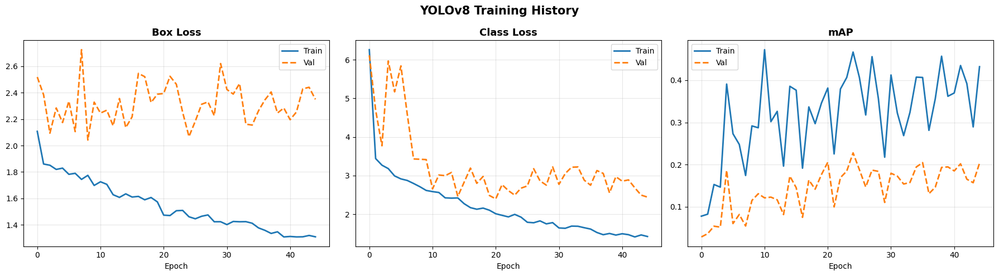

In [12]:
results_csv = Path(f'{WORK_DIR}/pcb_yolov8/results.csv')
import pandas as pd
df = pd.read_csv(results_csv)
df.columns = df.columns.str.strip()

metrics_to_plot = [
    ('train/box_loss',   'val/box_loss',   'Box Loss'),
    ('train/cls_loss',   'val/cls_loss',   'Class Loss'),
    ('metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'mAP'),
]

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for ax, (train_col, val_col, title) in zip(axes, metrics_to_plot):
    if train_col in df.columns:
        ax.plot(df[train_col], label='Train', linewidth=2)
    if val_col in df.columns:
        ax.plot(df[val_col], label='Val', linewidth=2, linestyle='--')
    ax.set_title(title, fontweight='bold', fontsize=13)
    ax.set_xlabel('Epoch'); ax.legend(); ax.grid(alpha=0.3)

plt.suptitle('YOLOv8 Training History', fontsize=15, fontweight='bold')
plt.tight_layout(); plt.show()

Ultralytics 8.4.37 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 11,131,776 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2701.3±765.8 MB/s, size: 230.7 KB)
val: Scanning /kaggle/working/final_dataset/test/labels... 9 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 9/9 1.2Kit/s 0.0s
val: New cache created: /kaggle/working/final_dataset/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 6.5it/s 0.2s
                   all          9         10       0.25      0.188      0.186     0.0744
      component_damage          1          2          1        0.5      0.495      0.396
       component_crack          1          1          1          1      0.995      0.199
           dry_ solder          1          1          0          0          0          0
      component_liftup          2          2          0          0

ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (16,) and arg 1 with shape (8,).

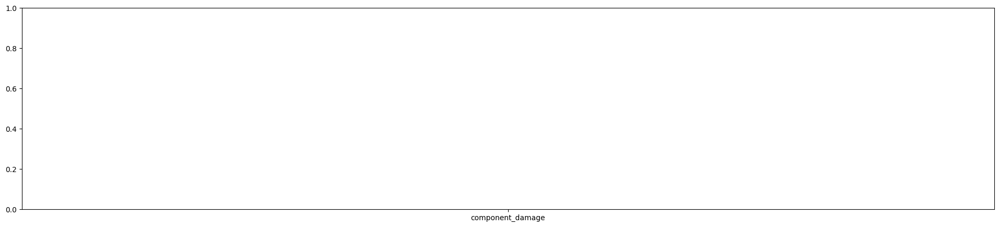

In [13]:
best_model = YOLO(BEST_MODEL_PATH)
test_metrics = best_model.val(
    data    = yaml_path,
    split   = 'test',
    imgsz   = 640,
    conf    = 0.25,
    iou     = 0.5,
    plots   = True,
    save_json = True,
)

print('\n── Test Set Results ──')
print(f'mAP@0.5      : {test_metrics.box.map50:.4f}')
print(f'mAP@0.5:0.95 : {test_metrics.box.map:.4f}')
print(f'Precision    : {test_metrics.box.mp:.4f}')
print(f'Recall       : {test_metrics.box.mr:.4f}')

print('\n── Per-Class AP@0.5 ──')
for cls_name, ap in zip(CLASS_NAMES, test_metrics.box.ap50):
    print(f'  {cls_name:30s}: {ap:.4f}')

# Bar chart of per-class AP
fig, ax = plt.subplots(figsize=(max(8, NUM_CLASSES * 1.5), 5))
aps = list(test_metrics.box.ap50)
bars = ax.bar(CLASS_NAMES, aps, color='#2ecc71', edgecolor='white')
ax.bar_label(bars, fmt='%.3f', padding=3)
ax.axhline(test_metrics.box.map50, color='red', linestyle='--',
           label=f'mAP@0.5 = {test_metrics.box.map50:.3f}')
ax.set_ylim(0, 1.1)
ax.set_xlabel('Defect type'); ax.set_ylabel('AP@0.5')
ax.set_title('Per-Class Average Precision', fontweight='bold', fontsize=13)
ax.legend(); plt.xticks(rotation=30, ha='right')
plt.tight_layout(); plt.show()

In [ ]:
from ultralytics import YOLO
import yaml

# Read existing yaml to get paths
yaml_path = f'{WORK_DIR}/pcb_defects.yaml'


MODEL_SIZE = 'yolov8s.pt'


# Using 1280 preserves more detail than 640
IMGSZ = 1280

model = YOLO(MODEL_SIZE)

results = model.train(
    data     = yaml_path,
    epochs   = 150,          # more epochs for small dataset
    imgsz    = IMGSZ,
    batch    = 4,            # smaller batch for 1280 resolution
    patience = 30,           # more patience
    optimizer = 'AdamW',
    lr0      = 5e-4,         # slightly lower LR for fine-tuning
    lrf      = 0.01,
    weight_decay = 1e-4,
    warmup_epochs = 10,      # longer warmup

    # Augmentation — more aggressive for small dataset
    mosaic     = 1.0,        # always use mosaic (combines 4 images)
    mixup      = 0.2,
    copy_paste = 0.3,        # copies objects between images — great for rare classes
    flipud     = 0.5,
    fliplr     = 0.5,
    degrees    = 15,
    translate  = 0.1,
    scale      = 0.5,
    shear      = 5.0,
    perspective = 0.0005,
    hsv_h      = 0.015,
    hsv_s      = 0.7,
    hsv_v      = 0.4,
    erasing    = 0.4,        # random erasing helps with occlusion

    # Save
    project  = WORK_DIR,
    name     = 'pcb_yolov8_v2',
    exist_ok = True,
    plots    = True,
    save     = True,
    verbose  = True,
)

BEST_MODEL_PATH = f'{WORK_DIR}/pcb_yolov8_v2/weights/best.pt'
print(f'\nBest model: {BEST_MODEL_PATH}')

Ultralytics 8.4.37 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.3, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/pcb_defects.yaml, degrees=15, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=150, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.5, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=1280, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0005, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.2, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=pcb_yolov8_v2, nbs=64, nms=False, opset=None, optimize=False, optimizer=AdamW, overlap_mask=True, 

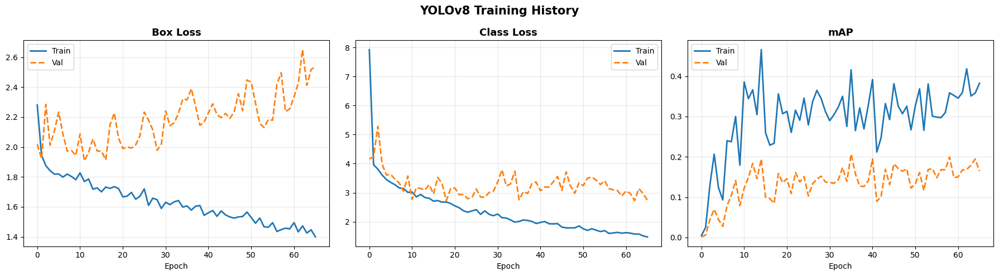

In [16]:
results_csv = Path(f'{WORK_DIR}/pcb_yolov8_v2/results.csv')
import pandas as pd
df = pd.read_csv(results_csv)
df.columns = df.columns.str.strip()

metrics_to_plot = [
    ('train/box_loss',   'val/box_loss',   'Box Loss'),
    ('train/cls_loss',   'val/cls_loss',   'Class Loss'),
    ('metrics/mAP50(B)', 'metrics/mAP50-95(B)', 'mAP'),
]

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
for ax, (train_col, val_col, title) in zip(axes, metrics_to_plot):
    if train_col in df.columns:
        ax.plot(df[train_col], label='Train', linewidth=2)
    if val_col in df.columns:
        ax.plot(df[val_col], label='Val', linewidth=2, linestyle='--')
    ax.set_title(title, fontweight='bold', fontsize=13)
    ax.set_xlabel('Epoch'); ax.legend(); ax.grid(alpha=0.3)

plt.suptitle('YOLOv8 Training History', fontsize=15, fontweight='bold')
plt.tight_layout(); plt.show()

Ultralytics 8.4.37 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 11,131,776 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3453.1±843.7 MB/s, size: 251.6 KB)
val: Scanning /kaggle/working/final_dataset/test/labels.cache... 9 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 9/9 3.4Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 4.0it/s 0.2s
                   all          9         10      0.188       0.25      0.249      0.112
      component_damage          1          2          0          0          0          0
       component_crack          1          1        0.5          1      0.995      0.398
           dry_ solder          1          1          0          0          0          0
      component_liftup          2          2          0          0          0          0
            pad_damage          1          

ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (16,) and arg 1 with shape (8,).

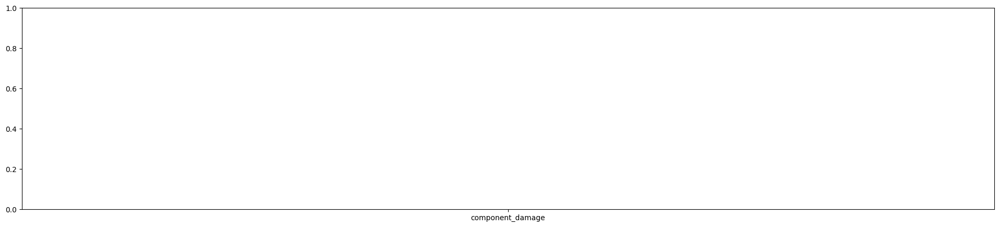

In [17]:
best_model = YOLO(BEST_MODEL_PATH)
test_metrics = best_model.val(
    data    = yaml_path,
    split   = 'test',
    imgsz   = 640,
    conf    = 0.25,
    iou     = 0.5,
    plots   = True,
    save_json = True,
)

print('\n── Test Set Results ──')
print(f'mAP@0.5      : {test_metrics.box.map50:.4f}')
print(f'mAP@0.5:0.95 : {test_metrics.box.map:.4f}')
print(f'Precision    : {test_metrics.box.mp:.4f}')
print(f'Recall       : {test_metrics.box.mr:.4f}')

print('\n── Per-Class AP@0.5 ──')
for cls_name, ap in zip(CLASS_NAMES, test_metrics.box.ap50):
    print(f'  {cls_name:30s}: {ap:.4f}')

# Bar chart of per-class AP
fig, ax = plt.subplots(figsize=(max(8, NUM_CLASSES * 1.5), 5))
aps = list(test_metrics.box.ap50)
bars = ax.bar(CLASS_NAMES, aps, color='#2ecc71', edgecolor='white')
ax.bar_label(bars, fmt='%.3f', padding=3)
ax.axhline(test_metrics.box.map50, color='red', linestyle='--',
           label=f'mAP@0.5 = {test_metrics.box.map50:.3f}')
ax.set_ylim(0, 1.1)
ax.set_xlabel('Defect type'); ax.set_ylabel('AP@0.5')
ax.set_title('Per-Class Average Precision', fontweight='bold', fontsize=13)
ax.legend(); plt.xticks(rotation=30, ha='right')
plt.tight_layout(); plt.show()

Ultralytics 8.4.37 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 11,131,776 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3222.6±639.8 MB/s, size: 254.1 KB)
val: Scanning /kaggle/working/final_dataset/test/labels.cache... 9 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 9/9 3.4Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 2.0it/s 0.5s
                   all          9         10      0.188      0.188      0.186     0.0559
Speed: 1.9ms preprocess, 26.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /kaggle/working/runs/detect/val5
conf=0.05  mAP50=0.1862  P=0.188  R=0.188
Ultralytics 8.4.37 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3152.7±967.8 MB/s, size: 257.7 KB)
val: Scanning /kaggle/working/final_dataset/test/labels.

,conf_threshold,mAP@0.5,mAP@0.5:0.95,Precision,Recall,F1
0,0.050000,0.186200,0.055900,0.187500,0.187500,0.187500
1,0.100000,0.186200,0.055900,0.187500,0.187500,0.187500
2,0.150000,0.186200,0.055900,0.187500,0.187500,0.187500
3,0.200000,0.186200,0.055900,0.187500,0.187500,0.187500
4,0.250000,0.124400,0.043500,0.203300,0.125000,0.154800
5,0.300000,0.124400,0.043500,0.203300,0.125000,0.154800
6,0.350000,0.124400,0.043500,0.203300,0.125000,0.154800
7,0.500000,0.124400,0.043500,0.203300,0.125000,0.154800


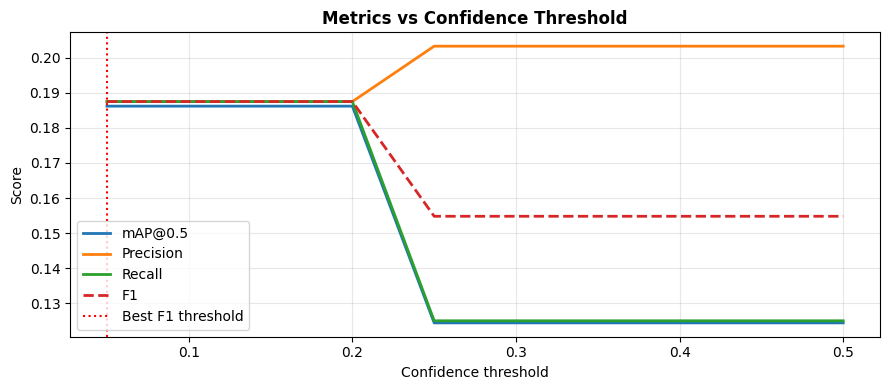


Use conf=0.05 for inference going forward.


In [19]:
import pandas as pd

best_model = YOLO(BEST_MODEL_PATH)

thresholds = [0.05, 0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.50]
rows = []

for conf in thresholds:
    m = best_model.val(
        data=yaml_path, split='test',
        imgsz=IMGSZ, conf=conf, iou=0.5, verbose=False
    )
    rows.append({
        'conf_threshold': conf,
        'mAP@0.5':        round(m.box.map50, 4),
        'mAP@0.5:0.95':   round(m.box.map,   4),
        'Precision':      round(m.box.mp,     4),
        'Recall':         round(m.box.mr,     4),
        'F1':             round(2*m.box.mp*m.box.mr / (m.box.mp+m.box.mr+1e-8), 4),
    })
    print(f'conf={conf:.2f}  mAP50={m.box.map50:.4f}  P={m.box.mp:.3f}  R={m.box.mr:.3f}')

df_thresh = pd.DataFrame(rows)
best_row  = df_thresh.loc[df_thresh['F1'].idxmax()]
print(f'\nBest F1 at conf={best_row["conf_threshold"]}:')
display(df_thresh.style.highlight_max(subset=['mAP@0.5','F1'], color='lightgreen'))

# Plot
fig, ax = plt.subplots(figsize=(9, 4))
ax.plot(df_thresh['conf_threshold'], df_thresh['mAP@0.5'],  label='mAP@0.5',   linewidth=2)
ax.plot(df_thresh['conf_threshold'], df_thresh['Precision'], label='Precision', linewidth=2)
ax.plot(df_thresh['conf_threshold'], df_thresh['Recall'],    label='Recall',    linewidth=2)
ax.plot(df_thresh['conf_threshold'], df_thresh['F1'],        label='F1',        linewidth=2, linestyle='--')
ax.axvline(best_row['conf_threshold'], color='red', linestyle=':', label=f'Best F1 threshold')
ax.set_xlabel('Confidence threshold'); ax.set_ylabel('Score')
ax.set_title('Metrics vs Confidence Threshold', fontweight='bold')
ax.legend(); ax.grid(alpha=0.3)
plt.tight_layout(); plt.show()

BEST_CONF = float(best_row['conf_threshold'])
print(f'\nUse conf={BEST_CONF} for inference going forward.')

Ultralytics 8.4.37 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Model summary (fused): 73 layers, 11,131,776 parameters, 0 gradients, 28.5 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 2712.1±465.7 MB/s, size: 226.2 KB)
val: Scanning /kaggle/working/final_dataset/test/labels.cache... 9 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 9/9 2.5Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 3.7it/s 0.3s
                   all          9         10      0.479        0.5      0.497      0.248
      component_damage          1          2          1        0.5      0.495      0.198
       component_crack          1          1        0.5          1      0.995      0.398
           dry_ solder          1          1          0          0          0          0
      component_liftup          2          2          1        0.5      0.495      0.198
            pad_damage          1          

ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (16,) and arg 1 with shape (8,).

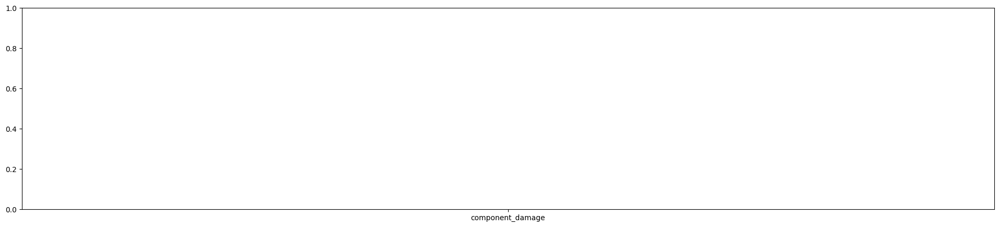

In [20]:
best_model = YOLO(BEST_MODEL_PATH)
test_metrics = best_model.val(
    data    = yaml_path,
    split   = 'test',
    imgsz   = 640,
    conf    = 0.05,
    iou     = 0.5,
    plots   = True,
    save_json = True,
)

print('\n── Test Set Results ──')
print(f'mAP@0.5      : {test_metrics.box.map50:.4f}')
print(f'mAP@0.5:0.95 : {test_metrics.box.map:.4f}')
print(f'Precision    : {test_metrics.box.mp:.4f}')
print(f'Recall       : {test_metrics.box.mr:.4f}')

print('\n── Per-Class AP@0.5 ──')
for cls_name, ap in zip(CLASS_NAMES, test_metrics.box.ap50):
    print(f'  {cls_name:30s}: {ap:.4f}')

# Bar chart of per-class AP
fig, ax = plt.subplots(figsize=(max(8, NUM_CLASSES * 1.5), 5))
aps = list(test_metrics.box.ap50)
bars = ax.bar(CLASS_NAMES, aps, color='#2ecc71', edgecolor='white')
ax.bar_label(bars, fmt='%.3f', padding=3)
ax.axhline(test_metrics.box.map50, color='red', linestyle='--',
           label=f'mAP@0.5 = {test_metrics.box.map50:.3f}')
ax.set_ylim(0, 1.1)
ax.set_xlabel('Defect type'); ax.set_ylabel('AP@0.5')
ax.set_title('Per-Class Average Precision', fontweight='bold', fontsize=13)
ax.legend(); plt.xticks(rotation=30, ha='right')
plt.tight_layout(); plt.show()

In [26]:
import json, shutil, cv2, random
from pathlib import Path
from collections import defaultdict
from tqdm.notebook import tqdm

WORK_DIR    = '/kaggle/working'
IMAGES_DIR  = '/kaggle/input/datasets/vidishagar/cvat-defect/CVAT Defective Photos'
MERGED_JSON = f'{WORK_DIR}/merged_coco.json'
CROP_DIR    = f'{WORK_DIR}/defect_crops'
PAD         = 15

# ── Load merged COCO ──
with open(MERGED_JSON) as f:
    merged = json.load(f)

# Build lookups from the ACTUAL merged JSON — not from CLASS_NAMES variable
# This guarantees folder names exactly match what's in the annotations
id_to_cat       = {c['id']: c['name'] for c in merged['categories']}
img_id_to_info  = {img['id']: img for img in merged['images']}
img_id_to_annos = defaultdict(list)
for a in merged['annotations']:
    img_id_to_annos[a['image_id']].append(a)

# ── Clean slate ──
if Path(CROP_DIR).exists():
    shutil.rmtree(CROP_DIR)
    print('Cleared old crop dir.')

# Create folders using ONLY names that actually appear in annotations
# (not CLASS_NAMES which may have duplicates/variants)
active_cat_names = set(id_to_cat[a['category_id']] for a in merged['annotations'])
for name in active_cat_names:
    Path(CROP_DIR, name).mkdir(parents=True, exist_ok=True)
print(f'Created {len(active_cat_names)} class folders: {sorted(active_cat_names)}')

# ── Crop ──
crop_counts = defaultdict(int)
skip_count  = 0

for img_info in tqdm(merged['images'], desc='Cropping'):
    fname    = Path(img_info['file_name']).name   # strip any subdir prefix
    img_path = Path(IMAGES_DIR) / fname
    if not img_path.exists():
        img_path = Path(IMAGES_DIR) / img_info['file_name']
    if not img_path.exists():
        skip_count += 1
        continue

    img = cv2.imread(str(img_path))
    if img is None:
        skip_count += 1
        continue
    ih, iw = img.shape[:2]

    for anno in img_id_to_annos[img_info['id']]:
        x, y, w, h = [int(v) for v in anno['bbox']]
        if w < 5 or h < 5:
            continue
        x1 = max(0, x - PAD);  y1 = max(0, y - PAD)
        x2 = min(iw, x+w+PAD); y2 = min(ih, y+h+PAD)
        crop = img[y1:y2, x1:x2]
        if crop.size == 0:
            continue
        cat_name = id_to_cat[anno['category_id']]
        out_path = Path(CROP_DIR) / cat_name / f'{img_info["id"]}_{anno["id"]}.jpg'
        cv2.imwrite(str(out_path), crop)
        crop_counts[cat_name] += 1

# ── Remove any folder that still ended up empty ──
removed = []
for folder in sorted(Path(CROP_DIR).iterdir()):
    imgs_in_folder = list(folder.glob('*.jpg')) + list(folder.glob('*.png'))
    if len(imgs_in_folder) == 0:
        shutil.rmtree(folder)
        removed.append(folder.name)

# ── Summary ──
print('\nCrops per class:')
for name, count in sorted(crop_counts.items()):
    print(f'  {name:35s}: {count}')
if removed:
    print(f'\nRemoved empty folders: {removed}')
if skip_count:
    print(f'Skipped {skip_count} images (not found on disk)')

VALID_CLASSES = sorted([f.name for f in Path(CROP_DIR).iterdir() if f.is_dir()])
print(f'\nFinal classes for classifier ({len(VALID_CLASSES)}): {VALID_CLASSES}')

Cleared old crop dir.
Created 15 class folders: ['component_crack', 'component_damage', 'component_liftup', 'component_missing', 'component_no solder', 'component_shift', 'component_solder short', 'component_tombstone', 'dry_ solder', 'dry_solder', 'led_damage', 'pad_damage', 'solder_ short', 'solder_boll', 'wrong_polarity']


Cropping:   0%|          | 0/92 [00:00<?, ?it/s]


Crops per class:
  component_crack                    : 7
  component_damage                   : 8
  component_liftup                   : 11
  component_missing                  : 9
  component_no solder                : 3
  component_shift                    : 2
  component_solder short             : 24
  component_tombstone                : 5
  dry_ solder                        : 2
  dry_solder                         : 12
  led_damage                         : 4
  pad_damage                         : 3
  solder_ short                      : 3
  solder_boll                        : 3
  wrong_polarity                     : 3

Final classes for classifier (15): ['component_crack', 'component_damage', 'component_liftup', 'component_missing', 'component_no solder', 'component_shift', 'component_solder short', 'component_tombstone', 'dry_ solder', 'dry_solder', 'led_damage', 'pad_damage', 'solder_ short', 'solder_boll', 'wrong_polarity']


In [27]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
from torch.utils.data import DataLoader, random_split, WeightedRandomSampler
from torchvision import datasets, models, transforms
from pathlib import Path

DEVICE   = 'cuda' if torch.cuda.is_available() else 'cpu'
CLF_PATH = f'{WORK_DIR}/pcb_classifier.pth'

# ── Transforms ──
train_tf = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.2),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]),
])
val_tf = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]),
])

# ── Load dataset — uses folder names from disk, guaranteed to be non-empty ──
full_ds     = datasets.ImageFolder(CROP_DIR, transform=train_tf)
clf_classes = full_ds.classes
n_full      = len(full_ds)
n_val_c     = max(len(clf_classes), int(n_full * 0.2))  # at least 1 per class in val
n_train_c   = n_full - n_val_c

print(f'Classes ({len(clf_classes)}): {clf_classes}')
print(f'Total crops: {n_full}  |  Train: {n_train_c}  Val: {n_val_c}')

# Per-class counts
class_counts = np.bincount([label for _, label in full_ds.samples])
print('\nPer-class crop counts:')
for cls, count in zip(clf_classes, class_counts):
    flag = '  ⚠ very few' if count < 5 else ''
    print(f'  {cls:35s}: {count}{flag}')

# ── Split ──
train_ds, val_ds = random_split(
    full_ds, [n_train_c, n_val_c],
    generator=torch.Generator().manual_seed(42)
)
# Val uses val_tf (no augmentation)
val_ds_clean = datasets.ImageFolder(CROP_DIR, transform=val_tf)

# ── Weighted sampler to handle class imbalance ──
train_labels   = [full_ds.samples[i][1] for i in train_ds.indices]
train_counts   = np.bincount(train_labels, minlength=len(clf_classes))
sample_weights = torch.tensor(
    [1.0 / max(train_counts[l], 1) for l in train_labels]
)
sampler = WeightedRandomSampler(sample_weights, len(sample_weights), replacement=True)

BATCH = min(16, n_train_c)
train_loader = DataLoader(train_ds,    batch_size=BATCH, sampler=sampler, num_workers=2)
val_loader   = DataLoader(
    torch.utils.data.Subset(val_ds_clean, val_ds.indices),
    batch_size=BATCH, shuffle=False, num_workers=2
)

# ── Model ──
clf_model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.IMAGENET1K_V1)
clf_model.classifier[1] = nn.Linear(
    clf_model.classifier[1].in_features, len(clf_classes)
)
clf_model = clf_model.to(DEVICE)

# Class-weighted loss
cw        = torch.tensor([1.0 / max(c, 1) for c in class_counts], dtype=torch.float).to(DEVICE)
criterion = nn.CrossEntropyLoss(weight=cw)
optimizer = optim.AdamW(clf_model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=30)

# ── Training loop ──
best_acc = 0.0
for epoch in range(30):
    clf_model.train()
    for imgs, labels in train_loader:
        imgs, labels = imgs.to(DEVICE), labels.to(DEVICE)
        optimizer.zero_grad()
        criterion(clf_model(imgs), labels).backward()
        optimizer.step()
    scheduler.step()

    clf_model.eval()
    correct = 0
    with torch.no_grad():
        for imgs, labels in val_loader:
            correct += (clf_model(imgs.to(DEVICE)).argmax(1) == labels.to(DEVICE)).sum().item()
    acc = correct / n_val_c
    if acc > best_acc:
        best_acc = acc
        torch.save(clf_model.state_dict(), CLF_PATH)
    if (epoch + 1) % 5 == 0:
        print(f'Epoch {epoch+1:02d}/30  val_acc={acc:.3f}  best={best_acc:.3f}')

clf_model.load_state_dict(torch.load(CLF_PATH, map_location=DEVICE))
clf_model.eval()
print(f'\nBest classifier accuracy: {best_acc:.4f}')

Classes (15): ['component_crack', 'component_damage', 'component_liftup', 'component_missing', 'component_no solder', 'component_shift', 'component_solder short', 'component_tombstone', 'dry_ solder', 'dry_solder', 'led_damage', 'pad_damage', 'solder_ short', 'solder_boll', 'wrong_polarity']
Total crops: 99  |  Train: 80  Val: 19

Per-class crop counts:
  component_crack                    : 7
  component_damage                   : 8
  component_liftup                   : 11
  component_missing                  : 9
  component_no solder                : 3  ⚠ very few
  component_shift                    : 2  ⚠ very few
  component_solder short             : 24
  component_tombstone                : 5
  dry_ solder                        : 2  ⚠ very few
  dry_solder                         : 12
  led_damage                         : 4  ⚠ very few
  pad_damage                         : 3  ⚠ very few
  solder_ short                      : 3  ⚠ very few
  solder_boll                       

100%|██████████| 20.5M/20.5M [00:00<00:00, 139MB/s]


Epoch 05/30  val_acc=0.053  best=0.053
Epoch 10/30  val_acc=0.158  best=0.158
Epoch 15/30  val_acc=0.263  best=0.263
Epoch 20/30  val_acc=0.263  best=0.263
Epoch 25/30  val_acc=0.263  best=0.263
Epoch 30/30  val_acc=0.263  best=0.263

Best classifier accuracy: 0.2632


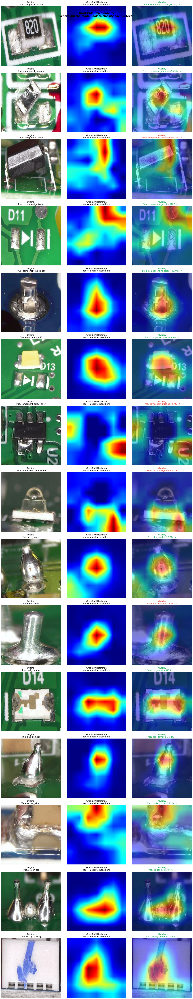

Saved: gradcam_results.png


In [28]:
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from torchvision import transforms
import torch

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

infer_tf = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]),
])

target_layer = clf_model.features[-1]
cam          = GradCAM(model=clf_model, target_layers=[target_layer])

# One random sample per class — read from disk folders (guaranteed non-empty)
samples = []
for cls_name in clf_classes:
    folder = Path(CROP_DIR) / cls_name
    imgs   = list(folder.glob('*.jpg')) + list(folder.glob('*.png'))
    if imgs:
        samples.append((cls_name, random.choice(imgs)))

n_show = len(samples)
fig, axes = plt.subplots(n_show, 3, figsize=(15, 5 * n_show))
if n_show == 1:
    axes = axes[np.newaxis, :]

for row, (cls_name, img_path) in enumerate(samples):
    img_bgr     = cv2.imread(str(img_path))
    img_rgb     = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img_rgb, (224, 224))
    img_float   = img_resized.astype(np.float32) / 255.0

    tensor = infer_tf(Image.fromarray(img_resized)).unsqueeze(0).to(DEVICE)

    with torch.no_grad():
        logits    = clf_model(tensor)
        pred_idx  = logits.argmax(1).item()
        pred_conf = torch.softmax(logits, 1)[0, pred_idx].item()

    grayscale_cam = cam(
        input_tensor=tensor,
        targets=[ClassifierOutputTarget(pred_idx)]
    )[0]

    cam_overlay = show_cam_on_image(img_float, grayscale_cam, use_rgb=True)
    hm_color    = cv2.cvtColor(
        cv2.applyColorMap((grayscale_cam * 255).astype(np.uint8), cv2.COLORMAP_JET),
        cv2.COLOR_BGR2RGB
    )

    correct     = clf_classes[pred_idx] == cls_name
    pred_color  = '#27ae60' if correct else '#e74c3c'
    pred_label  = f'{clf_classes[pred_idx]} ({pred_conf:.1%})'
    pred_label += '  ✓' if correct else '  ✗'

    axes[row, 0].imshow(img_resized)
    axes[row, 0].set_title(f'Original\nTrue: {cls_name}', fontsize=11)

    axes[row, 1].imshow(hm_color)
    axes[row, 1].set_title('Grad-CAM Heatmap\nred = model focused here', fontsize=11)

    axes[row, 2].imshow(cam_overlay)
    axes[row, 2].set_title(f'Overlay\nPred: {pred_label}', fontsize=11, color=pred_color)

    for ax in axes[row]:
        ax.axis('off')

plt.suptitle(
    'Grad-CAM Explainability\n"Where did the model look to classify each defect?"',
    fontsize=14, fontweight='bold'
)
plt.tight_layout()
plt.savefig(f'{WORK_DIR}/gradcam_results.png', dpi=150, bbox_inches='tight')
plt.show()
print('Saved: gradcam_results.png')


image 1/1 /kaggle/input/datasets/vidishagar/cvat-defect/CVAT Defective Photos/BD1 DAMAGE.jpg: 384x640 1 component_damage, 1 component_solder short, 45.3ms
Speed: 1.9ms preprocess, 45.3ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


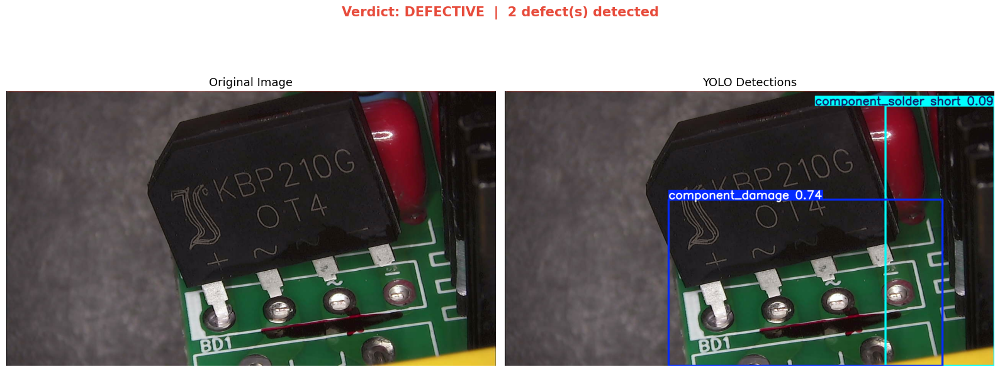


Detections (2 total):
  component_damage           conf=73.86%  box=[428,285,1145,720]
  component_solder short     conf=8.74%  box=[995,40,1280,720]


In [ ]:
DEMO_IMAGE = '/kaggle/input/datasets/vidishagar/cvat-defect/CVAT Defective Photos/BD1 DAMAGE.jpg'
CONF_THRESH = 0.05
# ═════════════════════════════════════

best_model = YOLO(BEST_MODEL_PATH)
yolo_results = best_model.predict(
    source=DEMO_IMAGE, conf=CONF_THRESH, iou=0.45, imgsz=640
)[0]

# Draw YOLO detections
img_bgr    = cv2.imread(DEMO_IMAGE)
img_rgb    = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
annotated  = yolo_results.plot()  # built-in YOLO visualization
annotated  = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(16, 7))
axes[0].imshow(img_rgb);    axes[0].set_title('Original Image', fontsize=13)
axes[1].imshow(annotated);  axes[1].set_title('YOLO Detections', fontsize=13)
for ax in axes: ax.axis('off')

n_det = len(yolo_results.boxes)
verdict_color = '#e74c3c' if n_det > 0 else '#27ae60'
fig.suptitle(f'Verdict: {"DEFECTIVE" if n_det > 0 else "GOOD"}  |  {n_det} defect(s) detected',
             fontsize=15, fontweight='bold', color=verdict_color)
plt.tight_layout(); plt.show()

# Print detections
print(f'\nDetections ({n_det} total):')
for box in yolo_results.boxes:
    cls_id = int(box.cls.item())
    conf   = box.conf.item()
    xyxy   = box.xyxy[0].tolist()
    print(f'  {CLASS_NAMES[cls_id]:25s}  conf={conf:.2%}  '
          f'box=[{xyxy[0]:.0f},{xyxy[1]:.0f},{xyxy[2]:.0f},{xyxy[3]:.0f}]')